In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

!pip install meteostat
# !pip install ydata-profiling

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import warnings
import re
from datetime import datetime
from meteostat import Point, Daily
import matplotlib.pyplot as plt
import ipywidgets as widgets
import missingno as msno

from IPython.display import display
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from ydata_profiling import ProfileReport


!jupyter nbextension enable --py widgetsnbextension
# Suppress all warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
/kaggle/input/avocado-prices/avocado.csv


In [2]:
df = pd.read_csv("/kaggle/input/avocado-prices/avocado.csv")

## DATA SUMMARY

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [4]:
df['average_revenue'] = df['AveragePrice'] * df['Total Volume']
df['average_revenue'] = df['average_revenue'].round(2)

In [5]:
regions_to_drop = ['TotalUS', 'West', 'GreatLakes', 'Northeast', 'Plains', 'SouthCentral', 'Southeast', "NorthernNewEngland", "Midsouth", "SouthCarolina", "WestTexNewMexico", "California" ]
df_filtered = df[~df['region'].isin(regions_to_drop)]
city_mapping = {
    'RaleighGreensboro': 'Raleigh',
    'NewOrleansMobile': 'New Orleans',
    'PhoenixTucson': 'Phoenix',
    'RichmondNorfolk': 'Richmond',
    'MiamiFtLauderdale': 'Miami',
    'BaltimoreWashington': 'Baltimore',
    'BuffaloRochester': 'Buffalo',
    'CincinnatiDayton': 'Cincinnati',
    'DallasFtWorth': 'Dallas',
    'HarrisburgScranton': 'Harrisburg',
    'HartfordSpringfield': 'Hartford'
}
def extract_city(region_name):
    return city_mapping.get(region_name, region_name)
# Apply the function to the 'region' column
df_filtered['region'] = df_filtered['region'].apply(extract_city)

In [6]:
df_filtered['region'].value_counts()

region
Albany          338
Raleigh         338
Nashville       338
New Orleans     338
NewYork         338
Orlando         338
Philadelphia    338
Phoenix         338
Pittsburgh      338
Portland        338
Richmond        338
Atlanta         338
Roanoke         338
Sacramento      338
SanDiego        338
SanFrancisco    338
Seattle         338
Spokane         338
StLouis         338
Syracuse        338
Miami           338
Louisville      338
LosAngeles      338
LasVegas        338
Baltimore       338
Boise           338
Boston          338
Buffalo         338
Charlotte       338
Chicago         338
Cincinnati      338
Columbus        338
Dallas          338
Denver          338
Detroit         338
GrandRapids     338
Harrisburg      338
Hartford        338
Houston         338
Indianapolis    338
Jacksonville    338
Tampa           338
Name: count, dtype: int64

In [7]:
city_locations = {
    "Albany": Point(42.75, -73.1333),
    "Raleigh": Point(35.7796, -78.6382),
    "Nashville": Point(36.1627, -86.7816),
    "New Orleans": Point(29.9511, -90.0715),
    "NewYork": Point(40.7128, -74.0060),
    "Orlando": Point(28.5383, -81.3792),
    "Philadelphia": Point(39.9526, -75.1652),
    "Phoenix": Point(33.4484, -112.0740),
    "Pittsburgh": Point(40.4406, -79.9959),
    "Portland": Point(45.5152, -122.6784),
    "Richmond": Point(37.5407, -77.4360),
    "Atlanta": Point(33.7490, -84.3880),
    "Roanoke": Point(37.2709, -79.9414),
    "Sacramento": Point(38.5816, -121.4944),
    "SanDiego": Point(32.7157, -117.1611),
    "SanFrancisco": Point(37.7749, -122.4194),
    "Seattle": Point(47.6062, -122.3321),
    "Spokane": Point(47.6588, -117.4260),
    "StLouis": Point(38.6270, -90.1994),
    "Syracuse": Point(43.0481, -76.1474),
    "Miami": Point(25.7617, -80.1918),
    "Louisville": Point(38.2527, -85.7585),
    "LosAngeles": Point(34.0522, -118.2437),
    "LasVegas": Point(36.1699, -115.1398),
    "Baltimore": Point(39.2904, -76.6122),
    "Boise": Point(43.6150, -116.2023),
    "Boston": Point(42.3601, -71.0589),
    "Buffalo": Point(42.8864, -78.8784),
    "Charlotte": Point(35.2271, -80.8431),
    "Chicago": Point(41.8781, -87.6298),
    "Cincinnati": Point(39.1031, -84.5120),
    "Columbus": Point(39.9612, -82.9988),
    "Dallas": Point(32.7767, -96.7970),
    "Denver": Point(39.7392, -104.9903),
    "Detroit": Point(42.3314, -83.0458),
    "GrandRapids": Point(42.9634, -85.6681),
    "Harrisburg": Point(40.2732, -76.8867),
    "Hartford": Point(41.7637, -72.6851),
    "Houston": Point(29.7604, -95.3698),
    "Indianapolis": Point(39.7684, -86.1581),
    "Jacksonville": Point(30.3322, -81.6557),
    "Tampa": Point(27.9506, -82.4572)
}

In [8]:
def fetch_temperature(city, location, start_date, end_date):
    data = Daily(location, start_date, end_date).fetch()
    data.index = pd.to_datetime(data.index)  # Ensure index is in datetime format
    return data[['tavg', 'tmin', 'tmax']]


start = datetime(2015, 1, 4)
end = datetime(2018, 3, 25)

temperature_data = {}
for city, location in city_locations.items():
    temperature_data[city] = fetch_temperature(city, location, start, end)

# Convert Date column to datetime
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])

def get_city_temperature(city, date):
    if city in temperature_data:
        temp_data = temperature_data[city]
        temp_data = temp_data.loc[temp_data.index.date == date.date()]  # Match dates
        if not temp_data.empty:
            return temp_data[['tavg', 'tmin', 'tmax']].mean().mean()
    return None

df_filtered['Temperature'] = df_filtered.apply(lambda row: get_city_temperature(row['region'], row['Date']), axis=1)

In [9]:
df_filtered.head(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,average_revenue,Temperature
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,85434.70,6.766667
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,74083.92,0.433333
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,109944.80,8.733333
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,85311.52,-0.533333
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,65330.69,1.533333


In [10]:
df_filtered.describe().T

,count,mean,min,25%,50%,75%,max,std
Unnamed: 0,14196.0,24.236686,0.0,10.0,24.0,38.0,52.0,15.483793
Date,14196,2016-08-14 00:00:00.000000256,2015-01-04 00:00:00,2015-10-25 00:00:00,2016-08-14 00:00:00,2017-06-04 00:00:00,2018-03-25 00:00:00,NaN
AveragePrice,14196.0,1.416943,0.44,1.11,1.37,1.68,3.25,0.414025
Total Volume,14196.0,247753.854803,84.56,8337.2275,64524.28,297594.315,5470227.08,441575.896488
4046,14196.0,79039.679661,0.0,541.585,4711.36,73420.6025,2914047.44,199003.598484
4225,14196.0,89309.173415,0.0,2081.16,17427.49,92862.8175,2283465.22,168951.830531
4770,14196.0,6946.233826,0.0,0.0,90.96,3073.99,279630.35,20398.493888
Total Bags,14196.0,72458.405148,0.0,3376.5925,23844.975,80668.7075,2701609.82,147105.408032
Small Bags,14196.0,55869.699677,0.0,1662.7,16059.37,62919.7575,2656630.42,128428.220022
Large Bags,14196.0,15663.938617,0.0,51.11,1602.91,10597.055,706052.84,42052.534209


In [11]:
df_filtered.describe(include = ['O']).T

,count,unique,top,freq
type,14196,2,conventional,7098
region,14196,42,Albany,338


## DATA PROFILING

In [12]:
profile = ProfileReport(df_filtered, title="Profiling MPG Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## DATA ANALYSE - BIVARIATE AND MULTIVARIATE ANALYSIS, CORRELATION AND SCATTER PLOT MATRIX

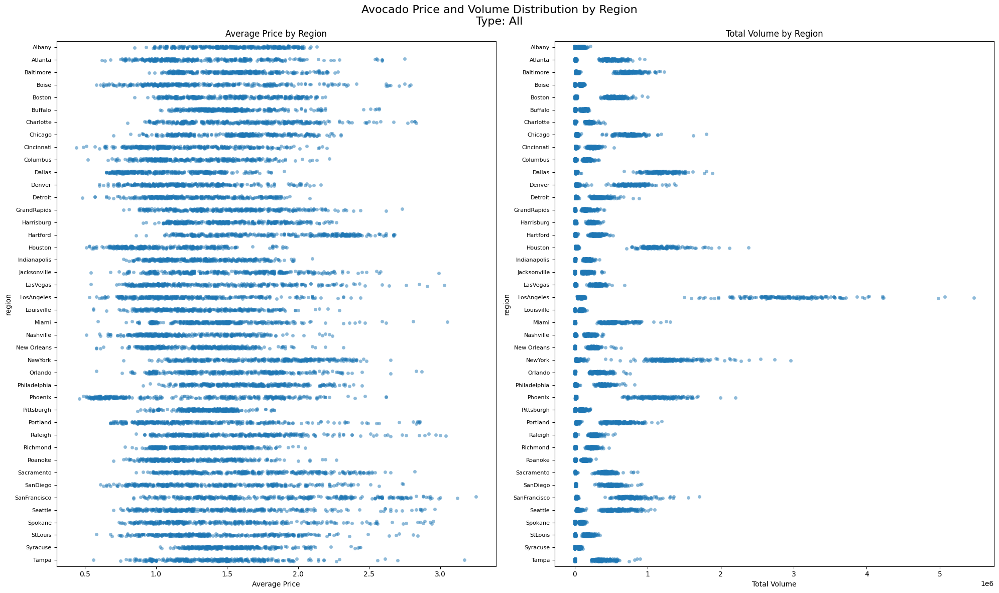

In [13]:
def plot_avocado_stripplots(df, avocado_type):
    # Filter the DataFrame based on selected avocado type
    if avocado_type == 'All':
        df_plot = df
    else:
        df_plot = df[df['type'] == avocado_type]

    # Create a figure with 1 row and 2 columns (side-by-side layout)
    fig, axes = plt.subplots(1, 2, figsize=(20, 12))

    # Plot the first strip plot for AveragePrice
    sns.stripplot(x='AveragePrice', y='region', data=df_plot, ax=axes[0], jitter=True, alpha=0.5)
    axes[0].set_title('Average Price by Region')
    axes[0].set_xlabel('Average Price')

    # Plot the second strip plot for Total Volume
    sns.stripplot(x='Total Volume', y='region', data=df_plot, ax=axes[1], jitter=True, alpha=0.5)
    axes[1].set_title('Total Volume by Region')
    axes[1].set_xlabel('Total Volume')

    # Rotate the y-axis labels for both plots for better readability
    for ax in axes:
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.tick_params(axis='y', labelsize=8)

    # Add a main title to the figure
    fig.suptitle(f'Avocado Price and Volume Distribution by Region\nType: {avocado_type}', fontsize=16)

    # Adjust the layout to prevent overlap
    plt.tight_layout()
    
    # Display the plots
    plt.show()

# Get unique avocado types and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())

# Create dropdown widget
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

# Create an output widget to display the plot
out = widgets.Output()

# Function to update plot based on selection
def update_plot(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        plot_avocado_stripplots(df_filtered, selected_type)

# Set up observer to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')

# Display the widget and the output
display(type_dropdown, out)

# Display initial plot
update_plot(None)



<Figure size 1600x1400 with 0 Axes>

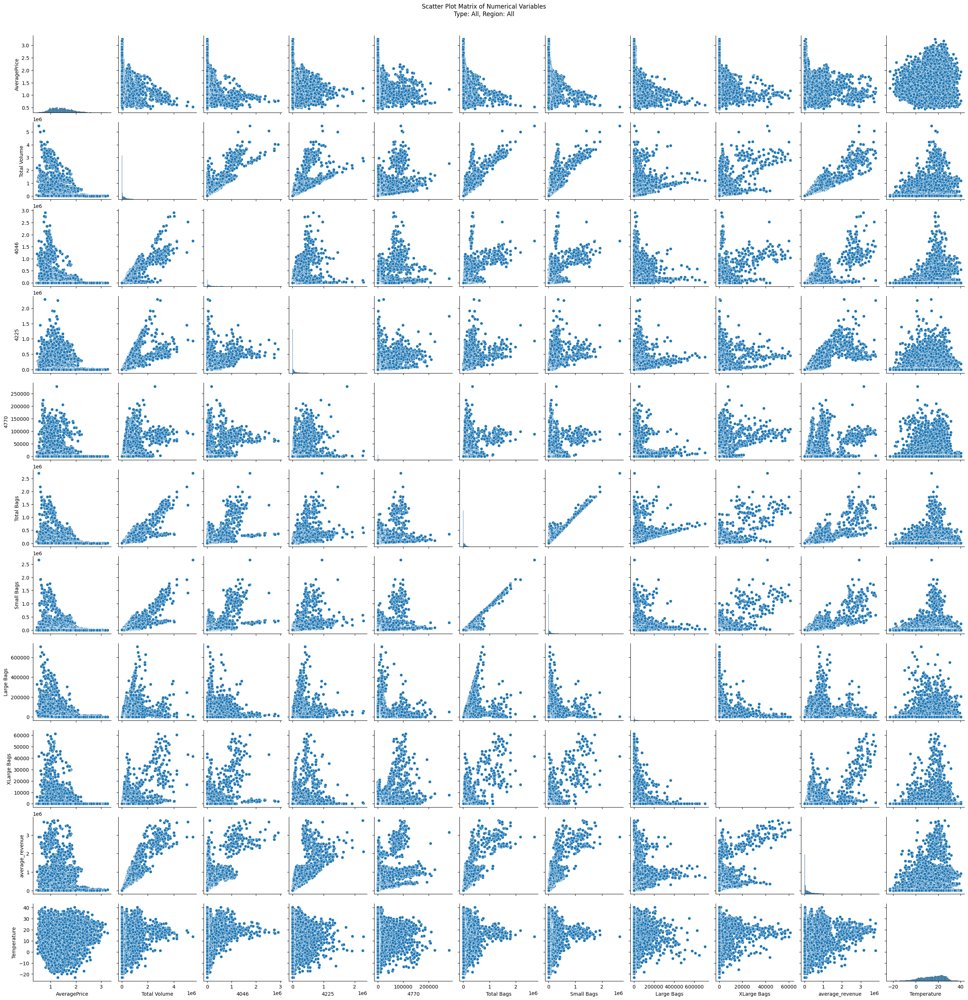

In [14]:
numerical_columns = [
    'AveragePrice', 
    'Total Volume', 
    '4046', 
    '4225', 
    '4770', 
    'Total Bags', 
    'Small Bags', 
    'Large Bags', 
    'XLarge Bags',
    'average_revenue',
    'Temperature'
]

def create_scatter_matrix(df, avocado_type, region):
    # Filter the DataFrame based on selected avocado type and region
    if avocado_type != 'All':
        df = df[df['type'] == avocado_type]
    if region != 'All':
        df = df[df['region'] == region]
    
    # Create a subset of the data with only the numerical columns
    df_numerical = df[numerical_columns]
    
    # Create the scatter plot matrix (pair plot)
    plt.figure(figsize=(16, 14))
    sns.pairplot(df_numerical)
    plt.suptitle(f'Scatter Plot Matrix of Numerical Variables\nType: {avocado_type}, Region: {region}', y=1.02)
    plt.show()

# Get unique avocado types and regions, and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())

# Create dropdown widgets
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create an output widget to display the plot
out = widgets.Output()

# Function to update plot based on selection
def update_plot(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        selected_region = region_dropdown.value
        create_scatter_matrix(df_filtered, selected_type, selected_region)

# Set up observers to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')
region_dropdown.observe(update_plot, names='value')

# Display the widgets and the output
display(widgets.HBox([type_dropdown, region_dropdown]), out)

# Display initial plot
update_plot(None)


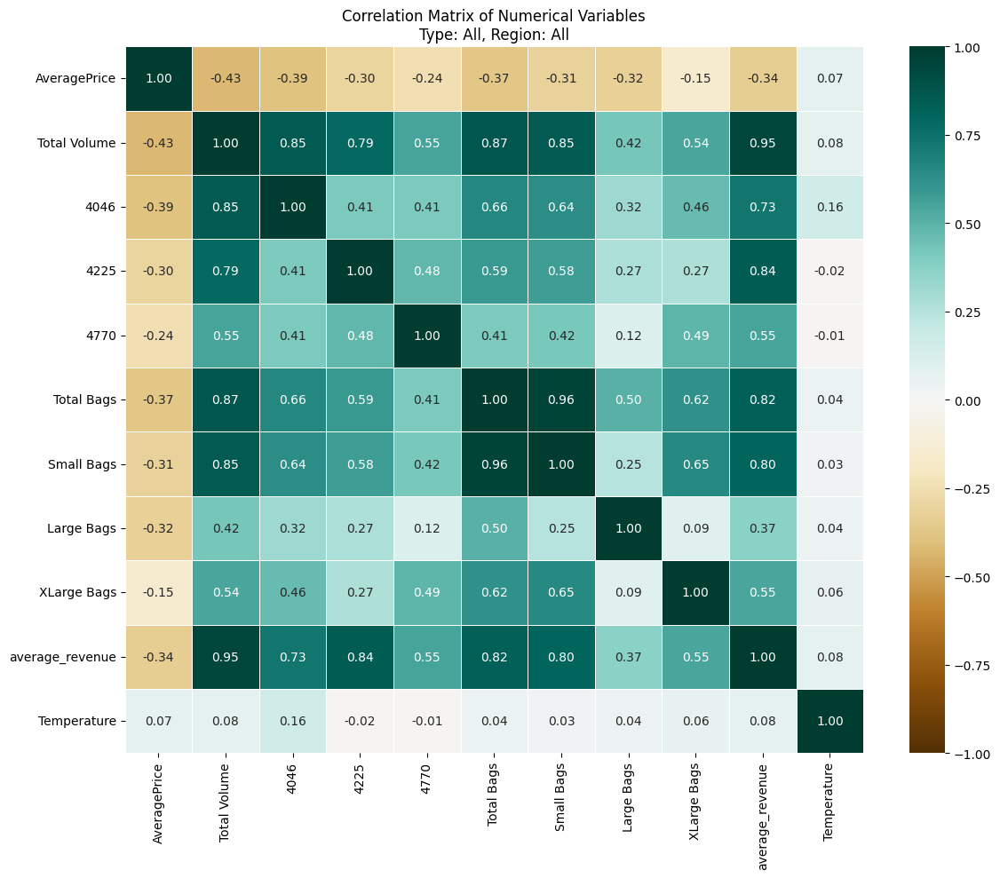

In [15]:
numerical_columns = [
    'AveragePrice', 
    'Total Volume', 
    '4046', 
    '4225', 
    '4770', 
    'Total Bags', 
    'Small Bags', 
    'Large Bags', 
    'XLarge Bags',
    'average_revenue',
    'Temperature'
]

def create_correlation_matrix(df, avocado_type, region):
    # Filter the DataFrame based on selected avocado type and region
    if avocado_type != 'All':
        df = df[df['type'] == avocado_type]
    if region != 'All':
        df = df[df['region'] == region]
    
    # Create a subset of the data with only the numerical columns
    df_numerical = df[numerical_columns]
    
    # Compute the correlation matrix
    correlation_matrix = df_numerical.corr()
    
    # Plot the correlation matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(correlation_matrix, annot=True, cmap='BrBG', fmt='.2f', linewidths=0.5, vmin=-1, vmax=1)
    plt.title(f'Correlation Matrix of Numerical Variables\nType: {avocado_type}, Region: {region}')
    plt.tight_layout()
    plt.show()

# Get unique avocado types and regions, and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())

# Create dropdown widgets
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create an output widget to display the plot
out = widgets.Output()

# Function to update plot based on selection
def update_plot(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        selected_region = region_dropdown.value
        create_correlation_matrix(df_filtered, selected_type, selected_region)

# Set up observers to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')
region_dropdown.observe(update_plot, names='value')

# Display the widgets and the output
display(widgets.HBox([type_dropdown, region_dropdown]), out)

# Display initial plot
update_plot(None)


## TIME SERIES AND AUTO_CORRELATION

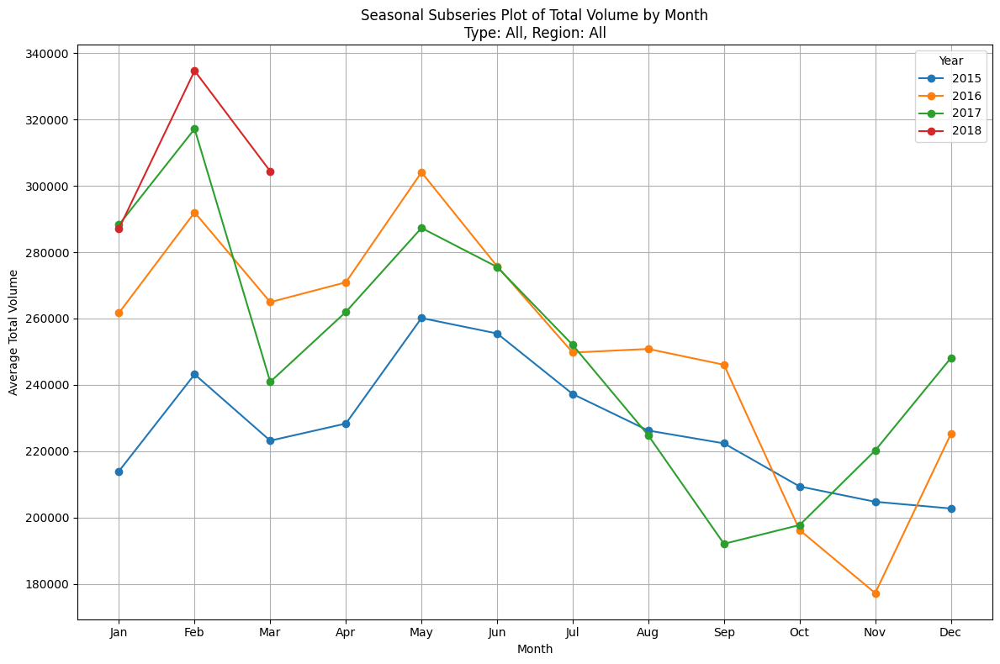

In [16]:
df_filtered['Month'] = df_filtered['Date'].dt.month
df_filtered['Year'] = df_filtered['Date'].dt.year

def create_seasonal_subseries(df, avocado_type, region):
    # Filter the DataFrame based on selected avocado type and region
    if avocado_type != 'All':
        df = df[df['type'] == avocado_type]
    if region != 'All':
        df = df[df['region'] == region]
    
    # Aggregate data by month and year
    monthly_data = df.groupby(['Year', 'Month'])['Total Volume'].mean().reset_index()
    
    # Pivot the data for plotting
    pivot_data = monthly_data.pivot(index='Month', columns='Year', values='Total Volume')
    
    # Plot the Seasonal Subseries Plot
    plt.figure(figsize=(12, 8))
    for year in pivot_data.columns:
        plt.plot(pivot_data.index, pivot_data[year], marker='o', label=year)
    plt.title(f'Seasonal Subseries Plot of Total Volume by Month\nType: {avocado_type}, Region: {region}')
    plt.xlabel('Month')
    plt.ylabel('Average Total Volume')
    plt.xticks(ticks=range(1, 13), labels=[
        'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
    ])
    plt.legend(title='Year')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Get unique avocado types and regions, and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())

# Create dropdown widgets
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create an output widget to display the plot
out = widgets.Output()

# Function to update plot based on selection
def update_plot(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        selected_region = region_dropdown.value
        create_seasonal_subseries(df_filtered, selected_type, selected_region)

# Set up observers to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')
region_dropdown.observe(update_plot, names='value')

# Display the widgets and the output
display(widgets.HBox([type_dropdown, region_dropdown]), out)

# Display initial plot
update_plot(None)

Output()

<Figure size 640x480 with 0 Axes>

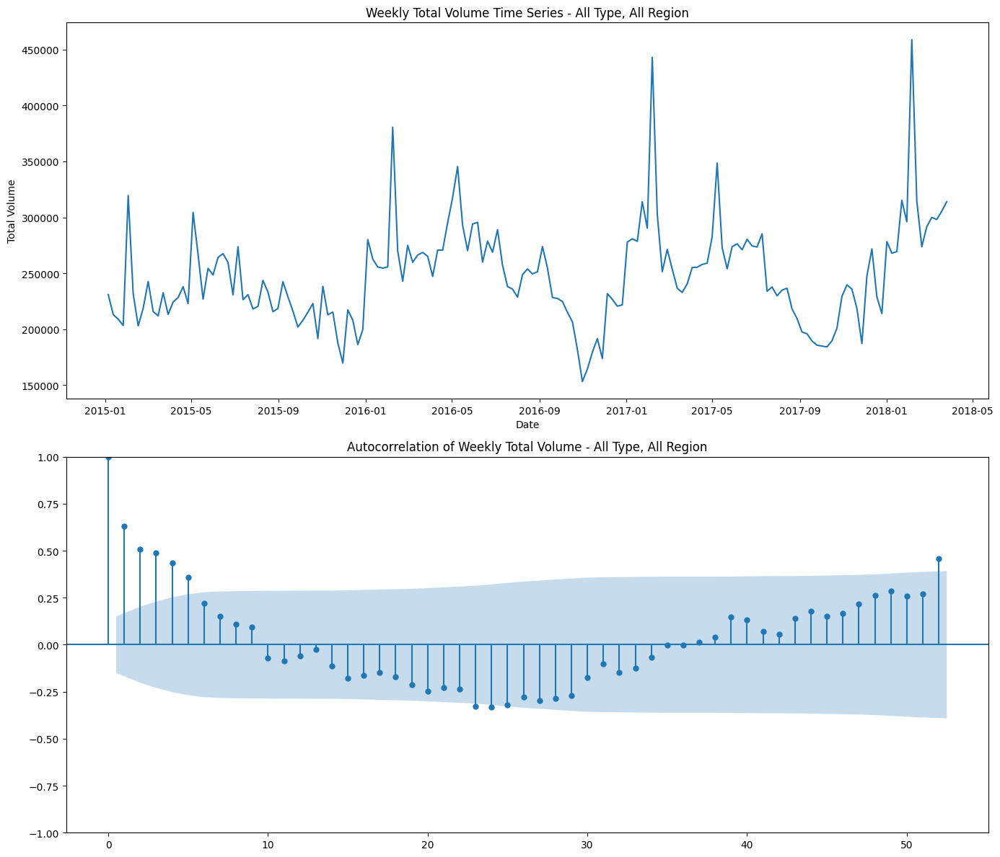

Autocorrelation analysis for All type, All region (weekly data):
First lag (lag 1) autocorrelation: 0.6319
Highest autocorrelation: 0.6318762282939966 at lag 1 week(s)
Autocorrelation at lag 4 (week(s)): 0.4343
Autocorrelation at lag 13 (week(s)): -0.0264
Autocorrelation at lag 26 (week(s)): -0.2793
Autocorrelation at lag 52 (week(s)): 0.4572


In [17]:
# Get unique avocado types and regions, and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())

# Create dropdown widgets
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create a radio button widget for time aggregation
time_agg = widgets.RadioButtons(
    options=['Weekly', 'Monthly'],
    value='Weekly',
    description='Aggregation:',
    disabled=False
)

# Create an output widget to display the plot
out = widgets.Output()

def plot_autocorrelation(avocado_type, region, aggregation):
    with out:
        # Clear the previous plot
        plt.clf()
        
        # Filter data by the selected avocado type and region
        if avocado_type == 'All' and region == 'All':
            filtered_data = df_filtered
        elif avocado_type == 'All':
            filtered_data = df_filtered[df_filtered['region'] == region]
        elif region == 'All':
            filtered_data = df_filtered[df_filtered['type'] == avocado_type]
        else:
            filtered_data = df_filtered[(df_filtered['type'] == avocado_type) & (df_filtered['region'] == region)]
        
        # Aggregate data by week or month
        if aggregation == 'Weekly':
            agg_data = filtered_data.groupby([pd.Grouper(key='Date', freq='W-MON')])['Total Volume'].mean().reset_index()
            lags = 52
            lag_unit = 'week(s)'
            seasonal_lags = [4, 13, 26, 52]  # Monthly, Quarterly, Semi-annual, Annual
        else:  # Monthly
            agg_data = filtered_data.groupby([pd.Grouper(key='Date', freq='M')])['Total Volume'].mean().reset_index()
            lags = 24
            lag_unit = 'month(s)'
            seasonal_lags = [3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 38]  # Quarterly, Semi-annual, Annual
        
        # Sort data by date and reset index
        agg_data = agg_data.sort_values('Date').reset_index(drop=True)
        
        # Calculate autocorrelation
        lag_acf = acf(agg_data['Total Volume'], nlags=lags)
        
        # Create subplots
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))
        
        # Plot time series
        ax1.plot(agg_data['Date'], agg_data['Total Volume'])
        ax1.set_title(f'{aggregation} Total Volume Time Series - {avocado_type} Type, {region} Region')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Total Volume')
        
        # Plot autocorrelation
        plot_acf(agg_data['Total Volume'], lags=lags, ax=ax2)
        ax2.set_title(f'Autocorrelation of {aggregation} Total Volume - {avocado_type} Type, {region} Region')
        
        plt.tight_layout()
        plt.show()
        
        # Print some statistics
        print(f"Autocorrelation analysis for {avocado_type} type, {region} region ({aggregation.lower()} data):")
        print(f"First lag (lag 1) autocorrelation: {lag_acf[1]:.4f}")
        print(f"Highest autocorrelation: {max(lag_acf[1:])} at lag {lag_acf[1:].argmax() + 1} {lag_unit}")
        
        # Check for seasonality
        for lag in seasonal_lags:
            if lag < len(lag_acf):
                print(f"Autocorrelation at lag {lag} ({lag_unit}): {lag_acf[lag]:.4f}")

# Function to update plot based on dropdown and radio button selections
def update_plot(change):
    out.clear_output(wait=True)
    plot_autocorrelation(type_dropdown.value, region_dropdown.value, time_agg.value)

# Set up observers to update the plot when widget values change
type_dropdown.observe(update_plot, names='value')
region_dropdown.observe(update_plot, names='value')
time_agg.observe(update_plot, names='value')

# Display the widgets and the output
display(widgets.HBox([type_dropdown, region_dropdown, time_agg]), out)

# Display initial plot
plot_autocorrelation(type_dropdown.value, region_dropdown.value, time_agg.value)

## OUTLIERS AND MISSING VALUES

In [18]:
df_filtered.isna().sum()

Unnamed: 0         0
Date               0
AveragePrice       0
Total Volume       0
4046               0
4225               0
4770               0
Total Bags         0
Small Bags         0
Large Bags         0
XLarge Bags        0
type               0
year               0
region             0
average_revenue    0
Temperature        0
Month              0
Year               0
dtype: int64

<Axes: >

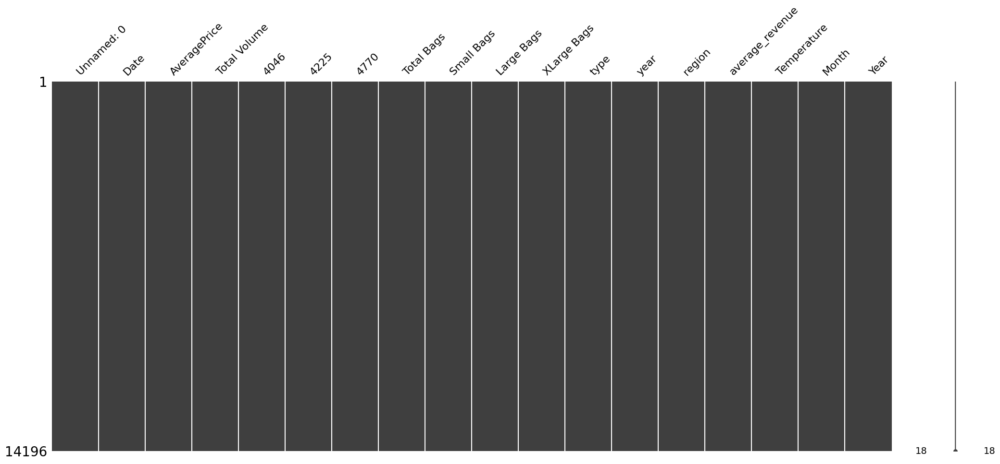

In [19]:
%matplotlib inline
msno.matrix(df_filtered)

In [20]:
# pd.set_option('display.max_rows', None)
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] < lower_bound) | (df[column] > upper_bound)]

def identify_outliers(df, avocado_type, selected_region):
    if avocado_type != 'All':
        df = df[df['type'] == avocado_type]
    
    if selected_region != 'All':
        df = df[df['region'] == selected_region]
    
    outliers_per_region = df.groupby('region').apply(detect_outliers_iqr, 'Total Volume').reset_index(drop=True)
    return outliers_per_region

# Get unique avocado types and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())
regions = ['All'] + list(df_filtered['region'].unique())  # Add 'All' option for regions as well

# Create dropdown widget for avocado type
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

# Create dropdown widget for region selection
region_dropdown = widgets.Dropdown(
    options=regions,
    value='All',
    description='Region:',
    disabled=False,
)

# Create an output widget to display the results
out = widgets.Output()

# Function to update results based on selection
def update_results(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        selected_region = region_dropdown.value
        outliers = identify_outliers(df_filtered, selected_type, selected_region)
        print(f"Outliers for {selected_type} avocados in {selected_region if selected_region != 'All' else 'all regions'}:")
        display(outliers)

# Set up observers to update the results when widget value changes
type_dropdown.observe(update_results, names='value')
region_dropdown.observe(update_results, names='value')

# Display the widgets and the output
display(type_dropdown, region_dropdown, out)

# Display initial results
update_results(None)


Outliers for All avocados in all regions:


,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,average_revenue,Temperature,Month,Year
0,7,2018-02-04,0.67,880540.45,167512.70,287359.89,60027.97,365639.89,266930.49,89516.48,9192.92,conventional,2018,Detroit,589962.10,-3.666667,2,2018
1,47,2017-02-05,0.81,391313.63,1573.98,298897.77,8303.14,82538.74,78260.30,3910.85,367.59,conventional,2017,GrandRapids,316964.04,-2.000000,2,2017
2,7,2018-02-04,0.88,408921.57,4371.02,193222.08,143538.35,67790.12,22315.79,1765.51,43708.82,conventional,2018,GrandRapids,359850.98,-4.900000,2,2018
3,47,2017-02-05,0.74,398543.91,191954.42,65200.84,357.77,141030.88,64165.61,76520.83,344.44,conventional,2017,Jacksonville,294922.49,14.400000,2,2017
4,47,2017-02-05,0.79,893143.94,432114.92,200199.09,273.63,260556.30,150022.99,110241.64,291.67,conventional,2017,Tampa,705583.71,18.466667,2,2017


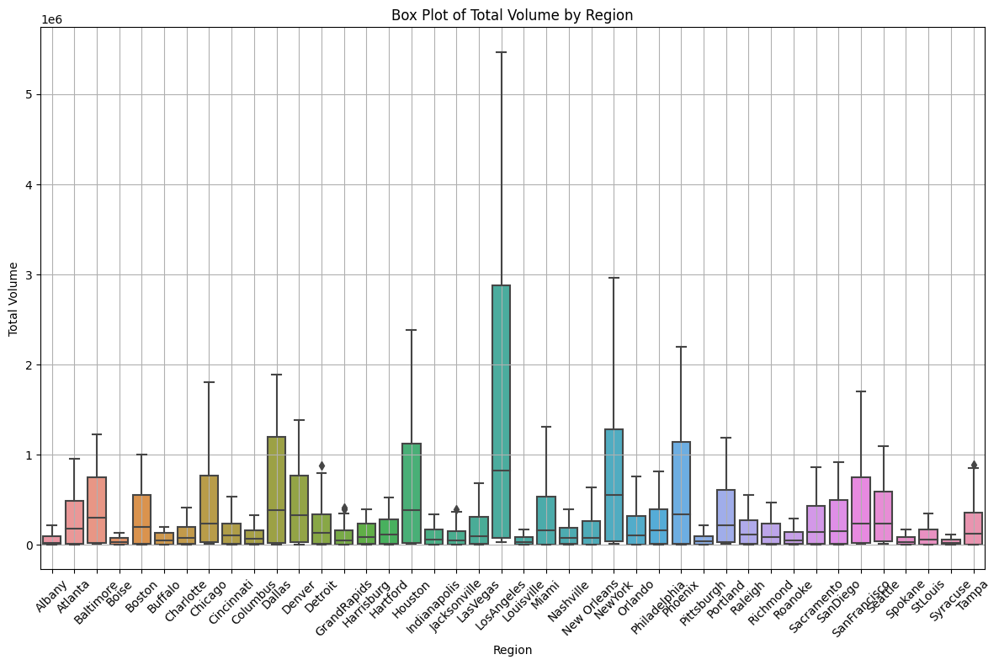

In [21]:
# Function to filter by avocado type and plot the box plot
def plot_boxplot(df, avocado_type):
    if avocado_type != 'All':
        df = df[df['type'] == avocado_type]
    
    plt.figure(figsize=(12, 8))
    sns.boxplot(x='region', y='Total Volume', data=df)
    plt.title(f'Box Plot of Total Volume by Region for {avocado_type} Avocados' if avocado_type != 'All' else 'Box Plot of Total Volume by Region')
    plt.xlabel('Region')
    plt.ylabel('Total Volume')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Get unique avocado types and add 'All' option
types = ['All'] + list(df_filtered['type'].unique())

# Create dropdown widget
type_dropdown = widgets.Dropdown(
    options=types,
    value='All',
    description='Type:',
    disabled=False,
)

# Create an output widget to display the plot
out = widgets.Output()

# Function to update plot based on selection
def update_plot(change):
    with out:
        out.clear_output(wait=True)
        selected_type = type_dropdown.value
        plot_boxplot(df_filtered, selected_type)

# Set up observer to update the plot when widget value changes
type_dropdown.observe(update_plot, names='value')

# Display the widget and the output
display(type_dropdown, out)

# Display initial plot
update_plot(None)

## PRE-PROCESSING DATA

In [22]:
df_filtered['Month'] = df_filtered['Date'].dt.month

df_filtered['Week'] = df_filtered['Date'].dt.isocalendar().week

In [23]:
inflation_rates = {
    2015: 0.0,    # No inflation for 2015 (base year)
    2016: 0.013,  # 1.3% inflation in 2016
    2017: 0.021,  # 2.1% inflation in 2017
    2018: 0.024,  # 2.4% inflation in 2018
}

def get_cumulative_deflation_factor(year):
    if year == 2015:
        return 1.0 
    
    factor = 1.0
    
    for y in range(2015, year + 1):
        factor *= (1 + inflation_rates[y])
    
    return factor


def adjust_for_inflation(row):
    year = row['year']  
    price = row['AveragePrice']
    cumulative_factor = get_cumulative_deflation_factor(year)
    return price / cumulative_factor

df_filtered['AdjustedPrice'] = df_filtered.apply(adjust_for_inflation, axis=1)


In [24]:
df_filtered.head(5)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,average_revenue,Temperature,Month,Year,Week,AdjustedPrice
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,85434.70,6.766667,12,2015,52,1.33
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,74083.92,0.433333,12,2015,51,1.35
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,109944.80,8.733333,12,2015,50,0.93
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,85311.52,-0.533333,12,2015,49,1.08
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,65330.69,1.533333,11,2015,48,1.28


In [51]:
df_main = df_filtered.copy()

In [52]:
columns_to_drop = ['AveragePrice', 'Unnamed: 0', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'average_revenue']

df_main = df_main.drop(columns=columns_to_drop)

In [53]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14196 entries, 0 to 18212
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           14196 non-null  datetime64[ns]
 1   Total Volume   14196 non-null  float64       
 2   type           14196 non-null  object        
 3   year           14196 non-null  int64         
 4   region         14196 non-null  object        
 5   Temperature    14196 non-null  float64       
 6   Month          14196 non-null  int32         
 7   Year           14196 non-null  int32         
 8   Week           14196 non-null  UInt32        
 9   AdjustedPrice  14196 non-null  float64       
dtypes: UInt32(1), datetime64[ns](1), float64(3), int32(2), int64(1), object(2)
memory usage: 1.5+ MB


In [54]:
df_main.head()

,Date,Total Volume,type,year,region,Temperature,Month,Year,Week,AdjustedPrice
0,2015-12-27,64236.62,conventional,2015,Albany,6.766667,12,2015,52,1.33
1,2015-12-20,54876.98,conventional,2015,Albany,0.433333,12,2015,51,1.35
2,2015-12-13,118220.22,conventional,2015,Albany,8.733333,12,2015,50,0.93
3,2015-12-06,78992.15,conventional,2015,Albany,-0.533333,12,2015,49,1.08
4,2015-11-29,51039.60,conventional,2015,Albany,1.533333,11,2015,48,1.28


Volme in T1, T2, T3

In [55]:
df_main = df_main.sort_values(['Date', 'region', 'type'])

In [56]:
for i in range(1, 6):
    df_main[f'lag{i}'] = df_main.groupby(['region', 'type'])['Total Volume'].shift(i)

In [62]:
df_main.tail(10)

,Date,Total Volume,type,year,region,Temperature,Month,Year,Week,AdjustedPrice,lag1,lag2,lag3,lag4,lag5
8994,2018-03-25,524265.69,conventional,2018,Seattle,6.200000,3,2018,12,1.321883,685505.57,514742.18,456320.30,636462.47,468075.23
18117,2018-03-25,96048.46,organic,2018,Seattle,6.200000,3,2018,12,1.397419,45893.20,69014.81,156527.16,105545.72,40425.93
9042,2018-03-25,99982.71,conventional,2018,Spokane,2.433333,3,2018,12,1.085832,98328.71,82487.75,94804.19,97120.83,79223.81
18165,2018-03-25,5750.56,organic,2018,Spokane,2.433333,3,2018,12,1.501281,5793.89,4790.07,5305.01,4720.69,4747.13
9054,2018-03-25,165209.29,conventional,2018,StLouis,5.466667,3,2018,12,1.180252,191261.08,249444.49,172050.58,188826.97,172847.28
18177,2018-03-25,8210.37,organic,2018,StLouis,5.466667,3,2018,12,1.718447,7105.79,8092.62,6858.14,7970.31,7007.39
9066,2018-03-25,93961.48,conventional,2018,Syracuse,-1.766667,3,2018,12,1.302999,71732.63,90823.29,89700.27,68888.16,65757.32
18189,2018-03-25,14503.47,organic,2018,Syracuse,-1.766667,3,2018,12,0.981970,6981.22,4685.01,3061.66,4162.96,5092.83
9078,2018-03-25,469300.74,conventional,2018,Tampa,20.433333,3,2018,12,1.255788,574380.46,580771.43,597351.68,484876.62,442206.63
18201,2018-03-25,10028.49,organic,2018,Tampa,20.433333,3,2018,12,1.331325,10311.24,8115.07,9851.33,9144.20,8534.53


In [67]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score

In [63]:
df = df_main.copy()

In [64]:
df['T1'] = df['Date'].dt.to_period('W').astype(str)

In [69]:
df.head()

,Date,Total Volume,type,year,region,Temperature,Month,Year,Week,AdjustedPrice,lag1,lag2,lag3,lag4,lag5,T1
51,2015-01-04,40873.28,0,2015,0,3.400000,1,2015,1,1.22,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
9177,2015-01-04,1373.95,1,2015,0,3.400000,1,2015,1,1.79,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
103,2015-01-04,435021.49,0,2015,1,12.666667,1,2015,1,1.00,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
9229,2015-01-04,3846.69,1,2015,1,12.666667,1,2015,1,1.76,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
155,2015-01-04,788025.06,0,2015,2,9.400000,1,2015,1,1.08,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04


In [68]:
le = LabelEncoder()
df['region'] = le.fit_transform(df['region'])
df['type'] = le.fit_transform(df['type'])

In [71]:
train_data = df[df['Date'].dt.year < 2018]
val_data = df[df['Date'].dt.year >= 2018]

In [72]:
train_data = train_data.drop('Date', axis=1)
val_data = val_data.drop('Date', axis=1)

In [73]:
features = ['year', 'region', 'type', 'Temperature', 'Month', 'Week', 'AdjustedPrice', 'lag1', 'lag2', 'lag3', 'lag4', 'lag5']
target = 'Total Volume'

In [74]:
X_train = train_data[features]
y_train = train_data[target]
X_val = val_data[features]
y_val = val_data[target]

In [75]:
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1)
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [85]:
val_data['Predicted_Volume'] = model.predict(X_val)

In [86]:
val_data['Error'] = val_data['Total Volume'] - val_data['Predicted_Volume']

In [87]:
last_week = val_data.groupby(['region', 'type']).last().reset_index()

In [79]:
latest_T1 = val_data['T1'].iloc[-1]
latest_data = X_val.iloc[-1].to_frame().T
predicted_volume = model.predict(latest_data)

In [88]:
output = last_week[['region', 'type', 'T1', 'Total Volume', 'Predicted_Volume', 'Error']]
output = output.rename(columns={'T1': 'Last_Week', 'Total Volume': 'Actual_Volume'})

In [89]:
output = output.sort_values(['region', 'type'])

In [90]:
print(output)

    region  type              Last_Week  Actual_Volume  Predicted_Volume  \
0        0     0  2018-03-19/2018-03-25      149396.50     111111.992188   
1        0     1  2018-03-19/2018-03-25        2321.82       4047.691162   
2        1     0  2018-03-19/2018-03-25      624645.42     605260.250000   
3        1     1  2018-03-19/2018-03-25       18717.08      18940.236328   
4        2     0  2018-03-19/2018-03-25      986038.75     938487.250000   
..     ...   ...                    ...            ...               ...   
79      39     1  2018-03-19/2018-03-25        8210.37       8029.715820   
80      40     0  2018-03-19/2018-03-25       93961.48      70321.765625   
81      40     1  2018-03-19/2018-03-25       14503.47       8872.926758   
82      41     0  2018-03-19/2018-03-25      469300.74     487623.250000   
83      41     1  2018-03-19/2018-03-25       10028.49      10252.112305   

           Error  
0   38284.507812  
1   -1725.871162  
2   19385.170000  
3    -223.1

In [104]:
albany_conv = df[(df['region'] == 40) & (df['type'] == 0)].sort_values('Date')

In [105]:
albany_conv

,Date,Total Volume,type,year,region,Temperature,Month,Year,Week,AdjustedPrice,lag1,lag2,lag3,lag4,lag5,T1
2599,2015-01-04,41143.51,0,2015,40,6.533333,1,2015,1,1.330000,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
2598,2015-01-11,42017.49,0,2015,40,-6.233333,1,2015,2,1.450000,41143.51,NaN,NaN,NaN,NaN,2015-01-05/2015-01-11
2597,2015-01-18,40391.55,0,2015,40,0.566667,1,2015,3,1.400000,42017.49,41143.51,NaN,NaN,NaN,2015-01-12/2015-01-18
2596,2015-01-25,44517.84,0,2015,40,-6.933333,1,2015,4,1.370000,40391.55,42017.49,41143.51,NaN,NaN,2015-01-19/2015-01-25
2595,2015-02-01,57424.15,0,2015,40,-8.166667,2,2015,5,1.260000,44517.84,40391.55,42017.49,41143.51,NaN,2015-01-26/2015-02-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9070,2018-02-25,68888.16,0,2018,40,5.033333,2,2018,8,1.170810,65757.32,78222.88,113023.35,73320.15,84994.86,2018-02-19/2018-02-25
9069,2018-03-04,89700.27,0,2018,40,-0.566667,3,2018,9,1.038622,68888.16,65757.32,78222.88,113023.35,73320.15,2018-02-26/2018-03-04
9068,2018-03-11,90823.29,0,2018,40,-3.166667,3,2018,10,1.057506,89700.27,68888.16,65757.32,78222.88,113023.35,2018-03-05/2018-03-11
9067,2018-03-18,71732.63,0,2018,40,-6.066667,3,2018,11,1.133042,90823.29,89700.27,68888.16,65757.32,78222.88,2018-03-12/2018-03-18


In [91]:
mse = mean_squared_error(y_val, val_data['Predicted_Volume'])
r2 = r2_score(y_val, val_data['Predicted_Volume'])

print(f"\nOverall Model Performance:")
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")


Overall Model Performance:
Mean Squared Error: 10985880236.40441
R-squared Score: 0.9586894400503592


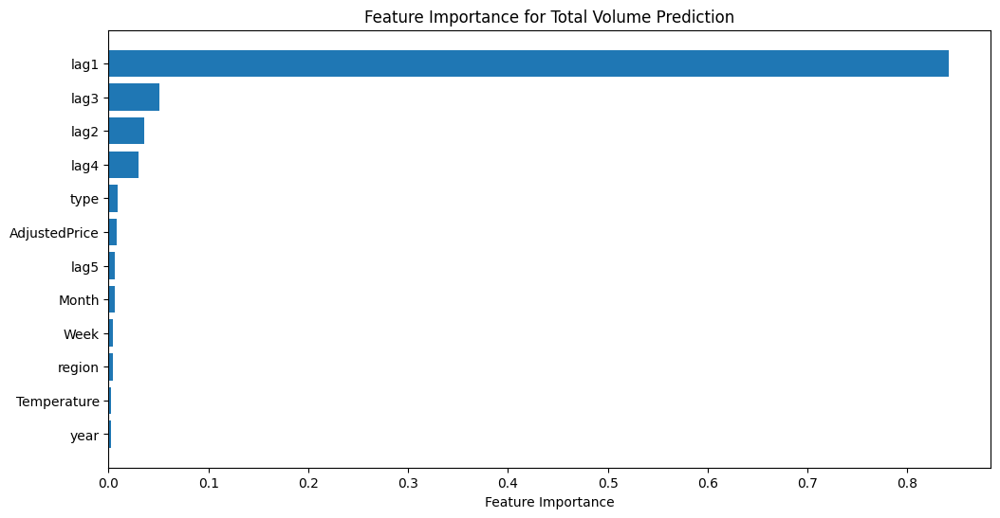

In [92]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, np.array(features)[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Total Volume Prediction')
plt.show()

In [95]:
df.head()

,Date,Total Volume,type,year,region,Temperature,Month,Year,Week,AdjustedPrice,lag1,lag2,lag3,lag4,lag5,T1
51,2015-01-04,40873.28,0,2015,0,3.400000,1,2015,1,1.22,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
9177,2015-01-04,1373.95,1,2015,0,3.400000,1,2015,1,1.79,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
103,2015-01-04,435021.49,0,2015,1,12.666667,1,2015,1,1.00,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
9229,2015-01-04,3846.69,1,2015,1,12.666667,1,2015,1,1.76,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
155,2015-01-04,788025.06,0,2015,2,9.400000,1,2015,1,1.08,NaN,NaN,NaN,NaN,NaN,2014-12-29/2015-01-04
